In [1]:
import pandas as pd 
import numpy as np 
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score, roc_curve 
from pandas_profiling import ProfileReport
import  matplotlib.pyplot as plt

In [2]:
df=pd.read_csv('D:/ineuron/ML/NOTES/winequality-red.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
x=df.drop(columns='quality')

In [6]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [7]:
y=df['quality']

In [8]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.20,random_state=300)

In [9]:
dt_model=DecisionTreeClassifier()

In [10]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [11]:
dt_model.predict(x_test)

array([6, 6, 6, 7, 5, 5, 5, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       5, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 7, 5, 5, 5, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 7, 6, 6, 5, 6, 4, 5, 6, 7, 5, 6, 6, 6, 5, 5, 6, 7, 5,
       7, 5, 4, 6, 5, 6, 6, 7, 6, 5, 8, 5, 6, 5, 5, 6, 6, 6, 7, 7, 5, 5,
       6, 4, 6, 6, 5, 7, 5, 6, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 6, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 8, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 8, 5, 6, 5, 6, 7, 5, 5,
       6, 6, 6, 6, 6, 8, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 6, 3, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       6, 6, 7, 5, 5, 5, 5, 5, 7, 5, 7, 5, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 7, 5, 5, 6, 5, 7, 7, 6, 5, 6, 8, 5,
       5, 5, 6, 5, 5, 5, 5, 4, 7, 6, 6, 7, 5, 6, 5,

In [12]:
dt_model.score(x_test,y_test)

0.625

In [13]:
dt_en=DecisionTreeClassifier(criterion='entropy')

In [14]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [15]:
dt_en.score(x_test,y_test)

0.615625

In [16]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [17]:
import matplotlib.pyplot as plt

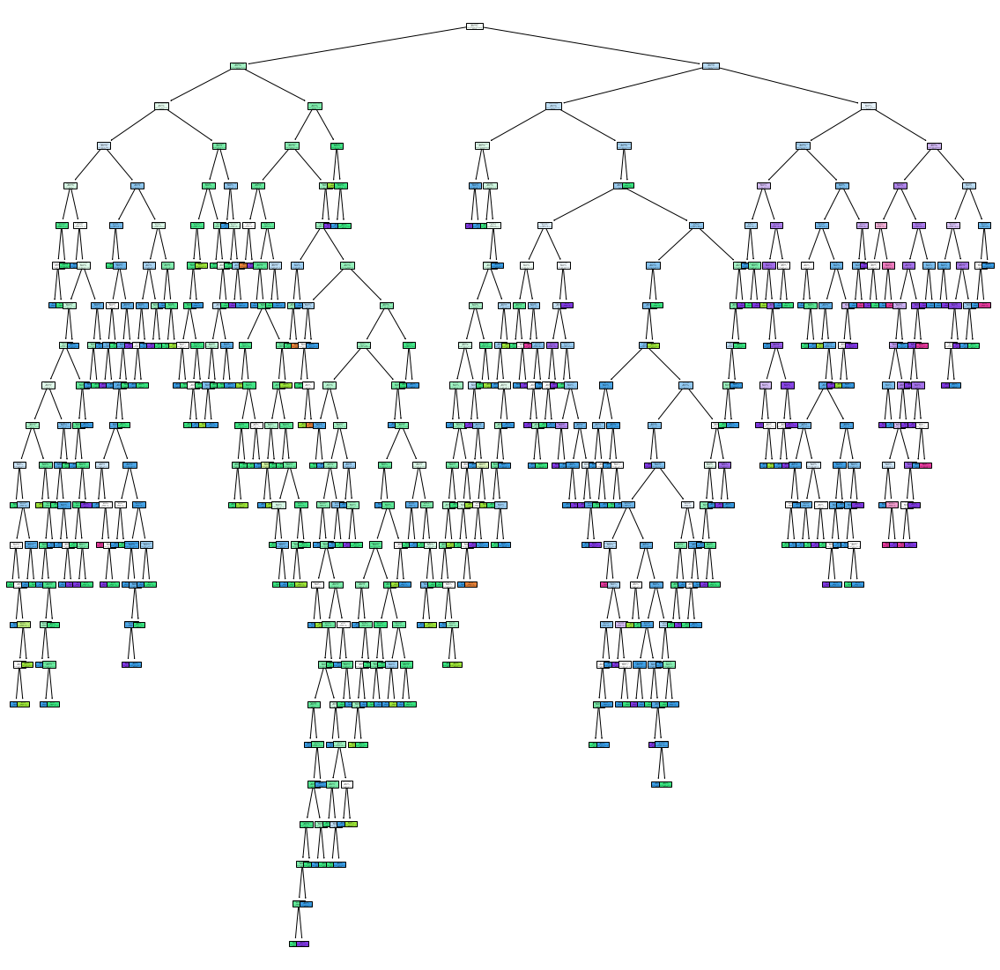

In [23]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True,class_names=[str(i) for i in set(y)],feature_names=x.columns)
plt.savefig('dt_model')

In [18]:
path=dt_model.cost_complexity_pruning_path(x,y)

In [19]:
ccp_alpha=path.ccp_alphas

In [20]:
ccp_alpha

array([0.        , 0.00040303, 0.00040921, 0.0005559 , 0.0005559 ,
       0.0005559 , 0.0005559 , 0.0005559 , 0.00056285, 0.00057327,
       0.00057327, 0.00057602, 0.00057728, 0.00058072, 0.00058275,
       0.0005863 , 0.00058761, 0.0005886 , 0.00058891, 0.00059412,
       0.00059933, 0.00060893, 0.00061236, 0.00061288, 0.00061381,
       0.00062539, 0.00062539, 0.00062539, 0.00062539, 0.00062539,
       0.00062539, 0.00062539, 0.00062539, 0.00062539, 0.00062539,
       0.00062539, 0.00062539, 0.00062539, 0.00062539, 0.00062539,
       0.00062539, 0.00062539, 0.00062539, 0.00078174, 0.0007976 ,
       0.00081301, 0.00083385, 0.00083385, 0.00083385, 0.00083385,
       0.00083385, 0.00083385, 0.00083385, 0.00083385, 0.00083385,
       0.00083385, 0.00083385, 0.00083385, 0.00083385, 0.00083385,
       0.00086814, 0.00087555, 0.00087632, 0.00088944, 0.00088944,
       0.00091492, 0.00092606, 0.00093809, 0.00093809, 0.00093809,
       0.00093809, 0.00093809, 0.00093809, 0.00093809, 0.00093

In [21]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x,y)
    dt_modle2.append(dt_m)

In [22]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00040302967132235405),
 DecisionTreeClassifier(ccp_alpha=0.0004092063712659915),
 DecisionTreeClassifier(ccp_alpha=0.0005559029949273851),
 DecisionTreeClassifier(ccp_alpha=0.0005559029949273851),
 DecisionTreeClassifier(ccp_alpha=0.0005559029949273851),
 DecisionTreeClassifier(ccp_alpha=0.0005559029949273851),
 DecisionTreeClassifier(ccp_alpha=0.0005559029949273851),
 DecisionTreeClassifier(ccp_alpha=0.0005628517823639776),
 DecisionTreeClassifier(ccp_alpha=0.000573274963518866),
 DecisionTreeClassifier(ccp_alpha=0.000573274963518866),
 DecisionTreeClassifier(ccp_alpha=0.0005760179059280473),
 DecisionTreeClassifier(ccp_alpha=0.000577283879347669),
 DecisionTreeClassifier(ccp_alpha=0.000580720092915215),
 DecisionTreeClassifier(ccp_alpha=0.0005827505827505828),
 DecisionTreeClassifier(ccp_alpha=0.0005863039399624766),
 DecisionTreeClassifier(ccp_alpha=0.000587606837606838),
 DecisionTreeClassifier(ccp_alpha=0.0005886031710

In [23]:
train_score = [i.score(x,y) for i in dt_modle2]
test_score = [i.score(x_test ,y_test) for i in dt_modle2]

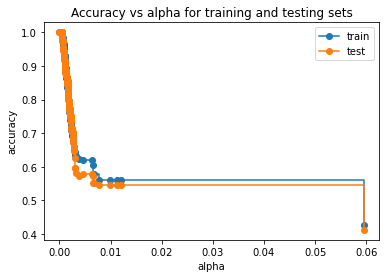

In [24]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [25]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x,y)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 815.4000000000001, 'alcohol <= 10.25\ngini = 0.643\nsamples = 1599\nvalue = [10, 53, 681, 638, 199, 18]\nclass = 5'),
 Text(279.0, 271.79999999999995, 'gini = 0.523\nsamples = 842\nvalue = [7, 29, 519, 260, 25, 2]\nclass = 5'),
 Text(837.0, 271.79999999999995, 'gini = 0.651\nsamples = 757\nvalue = [3, 24, 162, 378, 174, 16]\nclass = 6')]

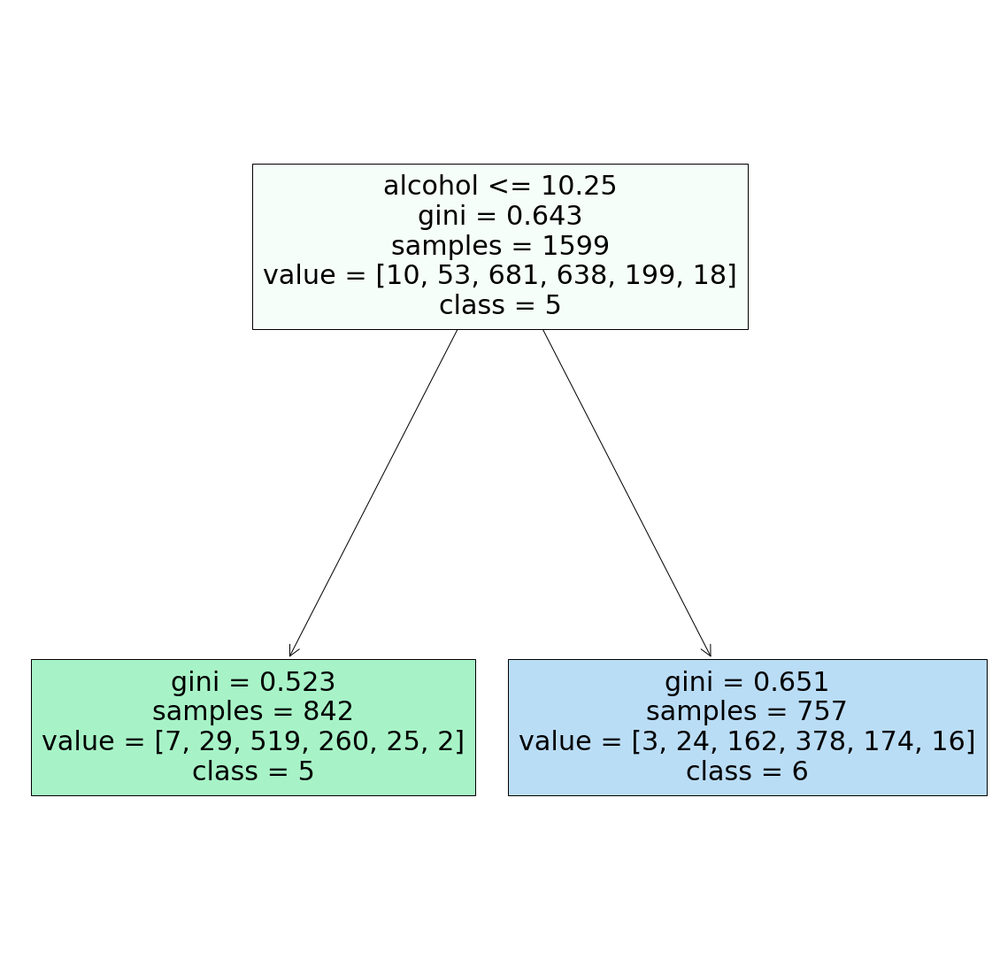

In [26]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True,class_names=[str(i) for i in set(y)],feature_names=x.columns)

In [27]:
dt_model_ccp.score(x,y)

0.5609756097560976

In [28]:
dt_model_ccp.score(x_test,y_test)

0.546875

In [29]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [30]:
grid_para={"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             }

In [31]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_para , cv = 10 , n_jobs=-1)

In [32]:
grid_ccp.fit(x,y)

GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [33]:
grid_ccp.best_params_ 

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 8,
 'min_samples_split': 2,
 'splitter': 'best'}

In [34]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=5 ,min_samples_leaf=8 , min_samples_split=2 , splitter='best')

In [35]:
dt_cpp_new.fit(x,y)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=8)

In [36]:
dt_cpp_new.score(x,y)

0.6378986866791745

In [37]:
dt_cpp_new.score(x_test,y_test)

0.640625

In [38]:
y_pred = dt_cpp_new.predict(x_test)

In [39]:
confusion_matrix(y_test,y_pred)

array([[  0,   1,   2,   2,   0,   0],
       [  0,   3,   5,   2,   0,   0],
       [  0,   1, 108,  23,   0,   0],
       [  0,   0,  39,  78,   8,   0],
       [  0,   0,   4,  26,  16,   0],
       [  0,   0,   0,   1,   1,   0]], dtype=int64)

In [40]:
from sklearn.ensemble import BaggingClassifier

In [41]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

In [42]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10)

In [43]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [44]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 5, 7, 7, 5, 6, 6, 6, 6,
       6, 7, 5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 7, 7, 5, 5, 6, 6, 5, 7, 6, 7,
       5, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 7, 5, 6, 6, 6, 5,
       5, 5, 5, 6, 7, 5, 5, 5, 7, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 5, 6, 5, 5, 7, 6, 6, 5, 6, 5, 5, 6, 6, 5, 5, 6, 6, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 7, 6, 5, 5, 6, 5, 5, 5,
       6, 5, 5, 6, 6, 7, 5, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 6, 6,
       5, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 7, 6, 5, 6, 5, 6, 5, 6, 5, 7, 6, 5,
       5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 7, 7, 6, 5, 6,
       6, 5, 6, 5, 6, 5, 5, 7, 5, 5, 5, 5, 6, 5, 5, 5, 5, 7, 5, 6, 6, 6,
       5, 6, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6,

In [45]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [46]:
from sklearn.neighbors import KNeighborsClassifier

In [47]:
bag_knn=BaggingClassifier(KNeighborsClassifier(6),n_estimators=10)

In [48]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [49]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 7, 6, 5, 5, 6, 6,
       6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 5, 6, 7, 7, 5, 5, 6, 6, 6, 7, 6, 5,
       6, 5, 5, 5, 5, 5, 5, 5, 4, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 6, 5,
       6, 7, 8, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       6, 5, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 7, 5, 6, 6, 5, 6, 5, 6, 6, 5,
       6, 5, 6, 5, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 6,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 7, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 6, 6, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 8, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 6, 5, 6, 5, 5, 5, 5, 5,

In [50]:
from sklearn.ensemble import RandomForestClassifier

In [51]:
rf=RandomForestClassifier()

In [52]:
rf.fit(x_train,y_train)

RandomForestClassifier()

In [53]:
rf.score(x_test,y_test)

0.675

In [54]:
bag_dt.score(x_test,y_test)

0.655

In [55]:
bag_knn.score(x_test,y_test)

0.4925

In [56]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=826799610),
 DecisionTreeClassifier(max_features='auto', random_state=1573685083),
 DecisionTreeClassifier(max_features='auto', random_state=602358960),
 DecisionTreeClassifier(max_features='auto', random_state=1363262840),
 DecisionTreeClassifier(max_features='auto', random_state=1224863442),
 DecisionTreeClassifier(max_features='auto', random_state=1114322333),
 DecisionTreeClassifier(max_features='auto', random_state=543286458),
 DecisionTreeClassifier(max_features='auto', random_state=1559335264),
 DecisionTreeClassifier(max_features='auto', random_state=546903586),
 DecisionTreeClassifier(max_features='auto', random_state=1575796275),
 DecisionTreeClassifier(max_features='auto', random_state=1319377079),
 DecisionTreeClassifier(max_features='auto', random_state=519694591),
 DecisionTreeClassifier(max_features='auto', random_state=168767286),
 DecisionTreeClassifier(max_features='auto', random_state=2013645813),
 DecisionTre

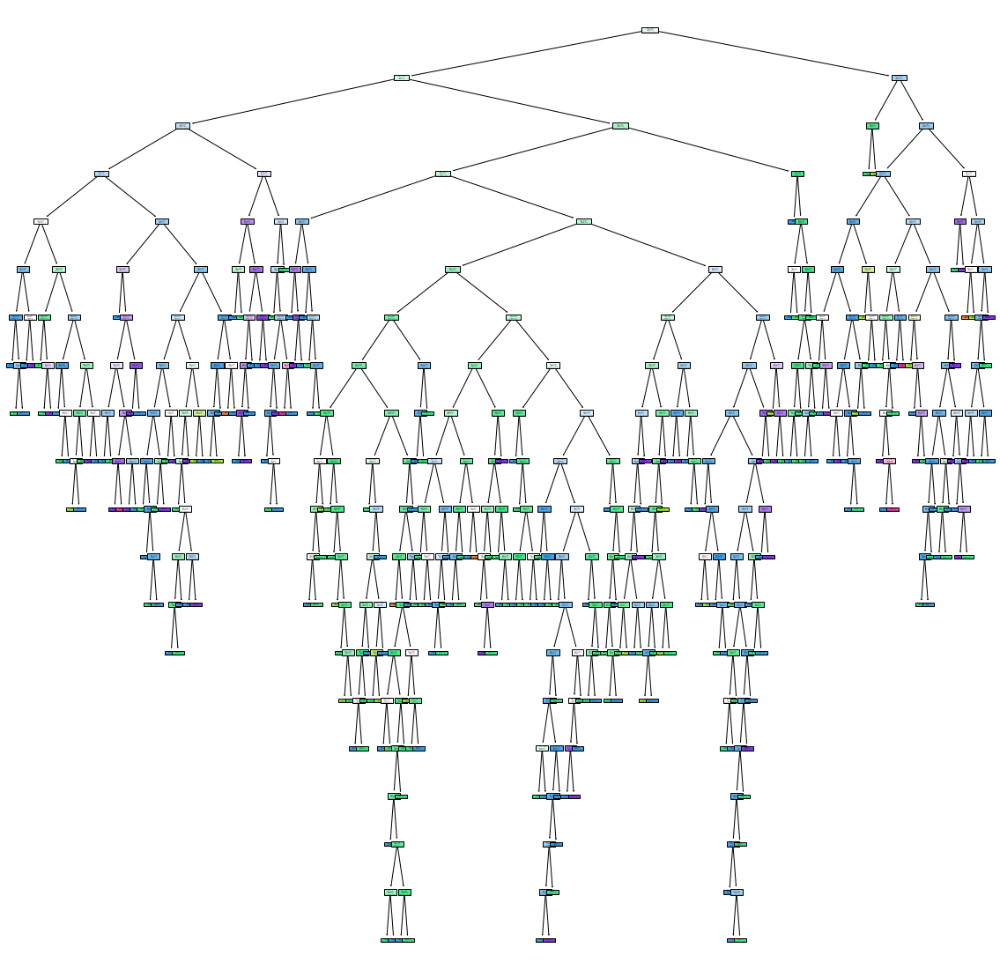

In [57]:
plt.figure(figsize = (20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i] , filled = True )

In [58]:
grid_para = {
    "n_estimators" : [5,10 , 50 , 100 , 120 , 150],
    'criterion' :['gini' ,'entropy'],
    'max_depth' :range(10),
    'min_samples_leaf' :range(10)
    
}

In [59]:
rf = RandomForestClassifier(n_estimators=5)

In [60]:
grid_serach_rf = GridSearchCV(param_grid= grid_para, cv = 10 , n_jobs=6,verbose=1 ,estimator = rf)

In [61]:
grid_serach_rf.fit(x_train,y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


C:\Users\Amit\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
C:\Users\Amit\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan ... 0.62804622 0.63636555 0.62804622]
  warnings.warn(


GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [62]:
grid_serach_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [63]:
rf_new = RandomForestClassifier(criterion='entropy' , max_depth=9 , min_samples_leaf= 1 , n_estimators=100)

In [64]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9)

In [65]:
rf_new.score(x_test,y_test)

0.675